<a href="https://colab.research.google.com/github/saransaran45/Door_Number_FindingSystem/blob/main/DSA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp -r "/content/drive/MyDrive/my drive/AirQuality/" "/content/"

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import mean_squared_error, accuracy_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
warnings.filterwarnings('ignore')


In [ ]:
directory = '/content'
air_df = pd.read_csv("/content/AirQuality/AirQualityUCI.csv")

x = air_df.drop(columns='C6H6(GT)')
y =  air_df['C6H6(GT)']

print(air_df.describe())

            CO(GT)  PT08.S1(CO)     NMHC(GT)     C6H6(GT)  PT08.S2(NMHC)  \
count  9357.000000  9357.000000  9357.000000  9357.000000    9357.000000   
mean    -34.207524  1048.990061  -159.090093     1.865683     894.595276   
std      77.657170   329.832710   139.789093    41.380206     342.333252   
min    -200.000000  -200.000000  -200.000000  -200.000000    -200.000000   
25%       0.600000   921.000000  -200.000000     4.000000     711.000000   
50%       1.500000  1053.000000  -200.000000     7.900000     895.000000   
75%       2.600000  1221.000000  -200.000000    13.600000    1105.000000   
max      11.900000  2040.000000  1189.000000    63.700000    2214.000000   

           NOx(GT)  PT08.S3(NOx)      NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)  \
count  9357.000000   9357.000000  9357.000000   9357.000000  9357.000000   
mean    168.616971    794.990168    58.148873   1391.479641   975.072032   
std     257.433866    321.993552   126.940455    467.210125   456.938184   
min    -200

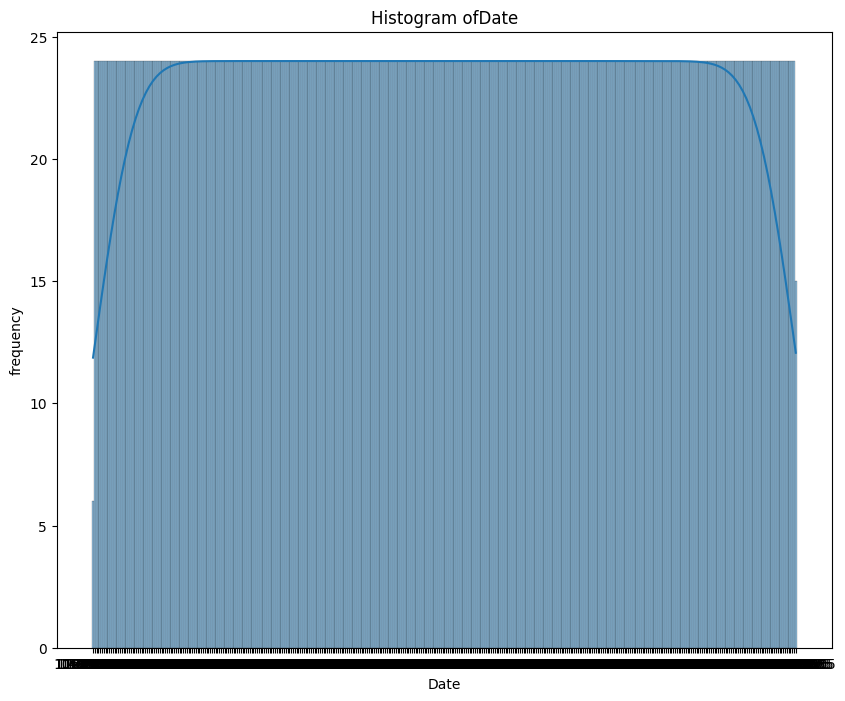

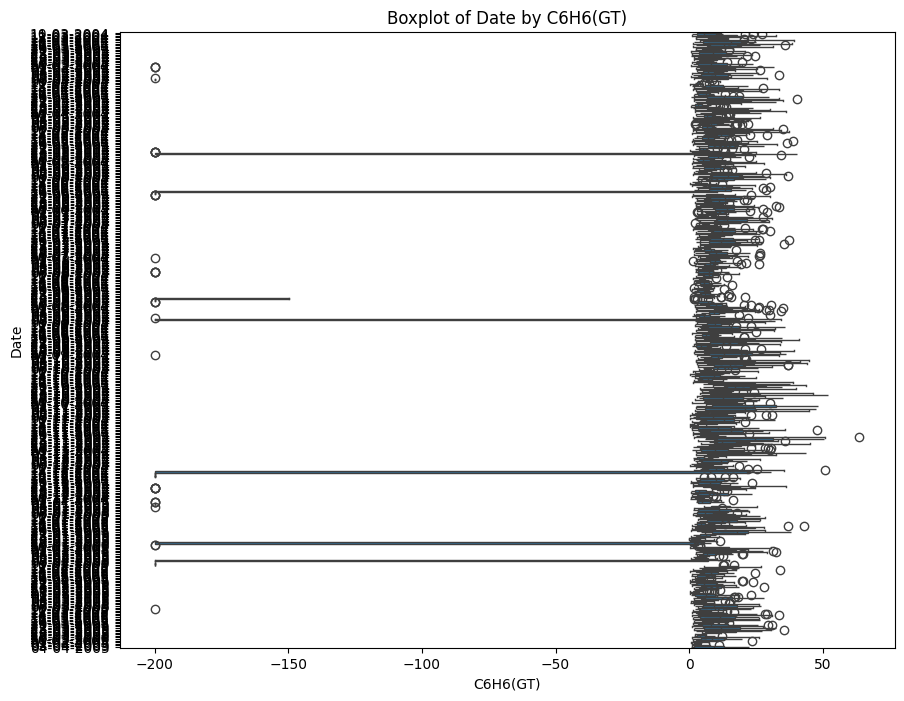

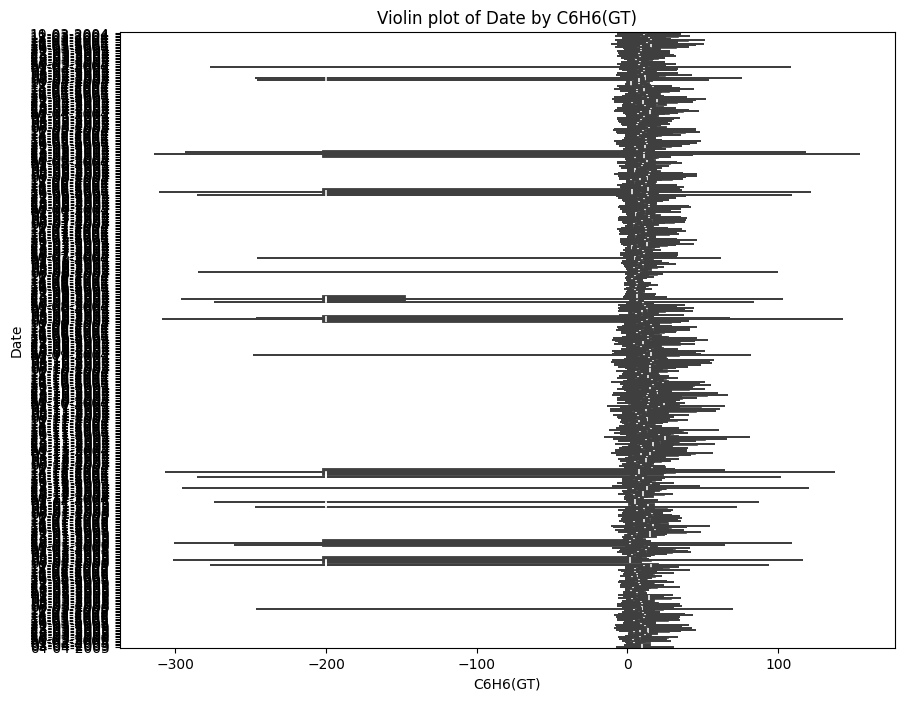

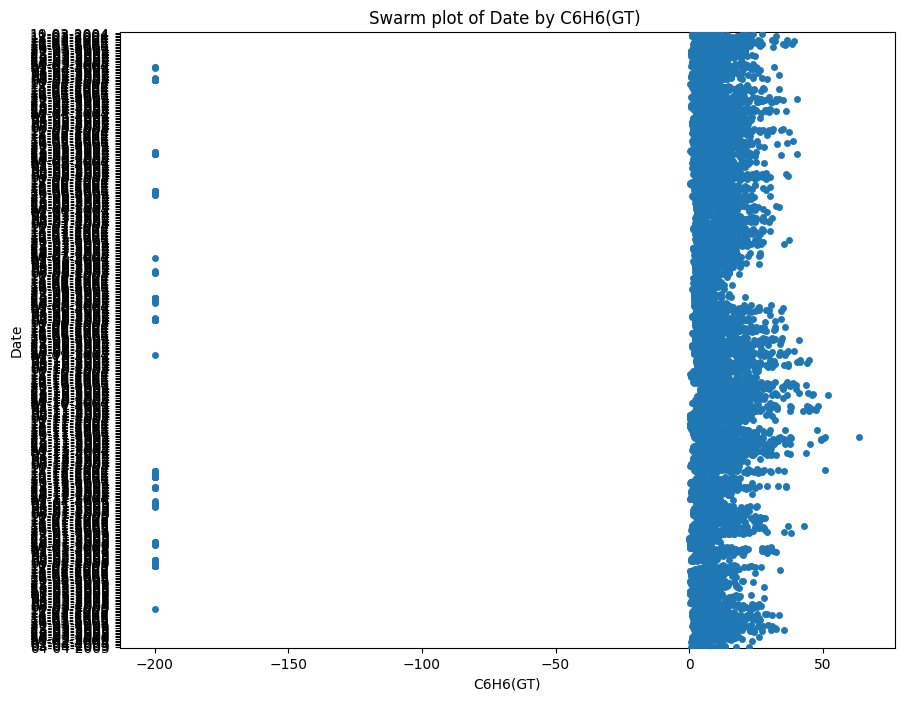

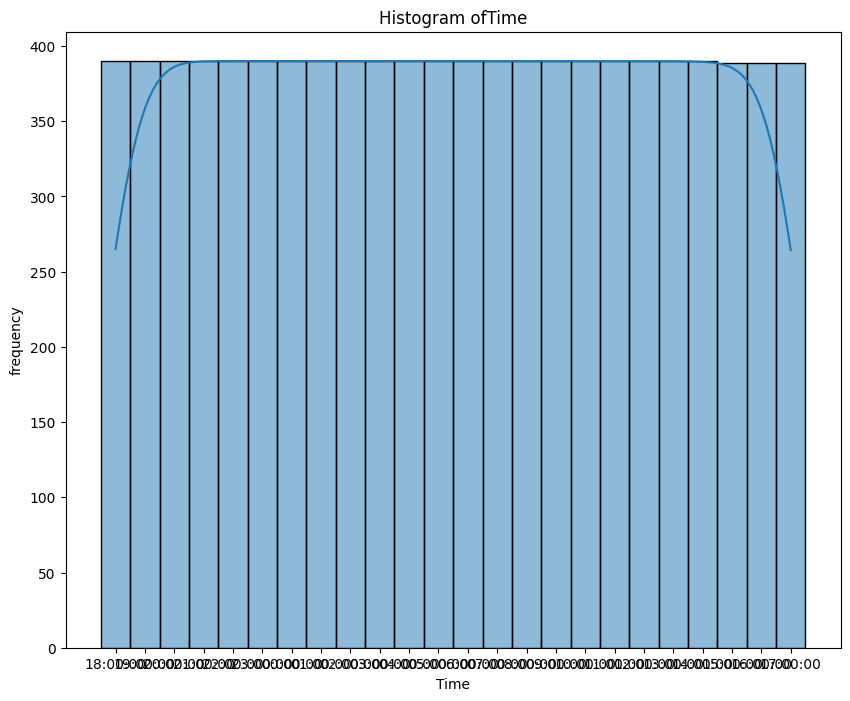

...

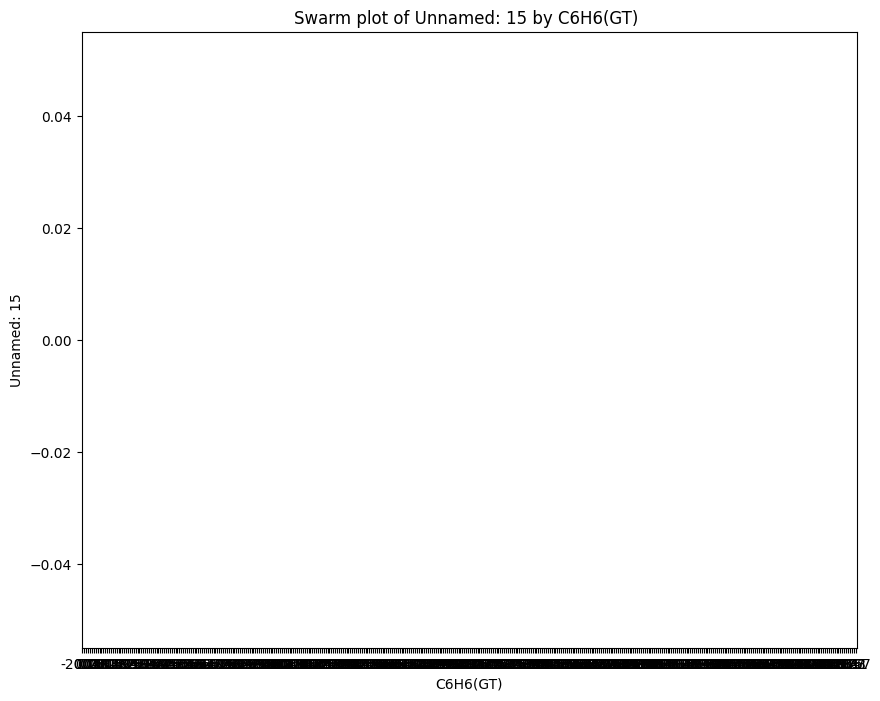

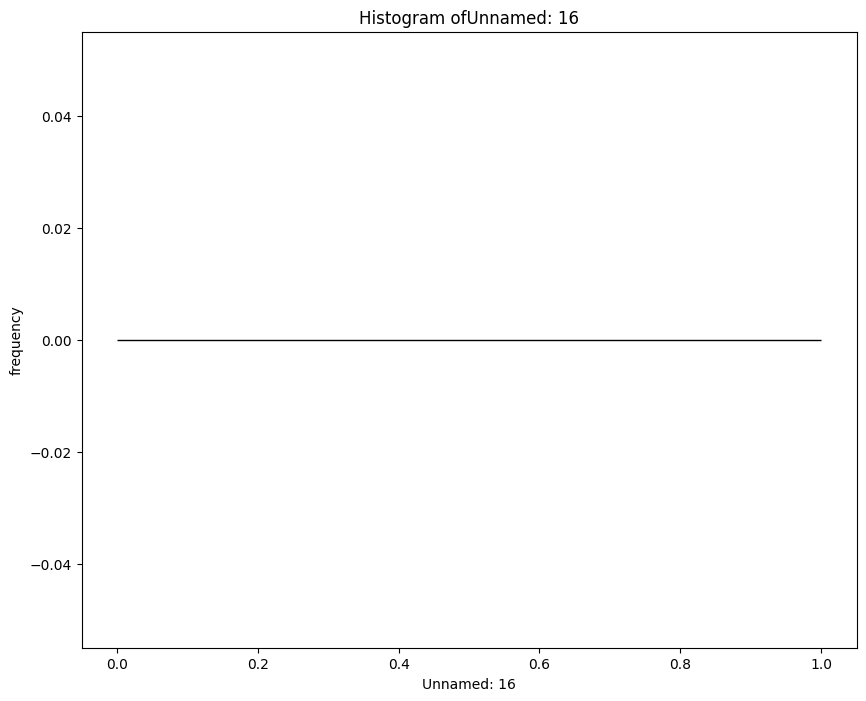

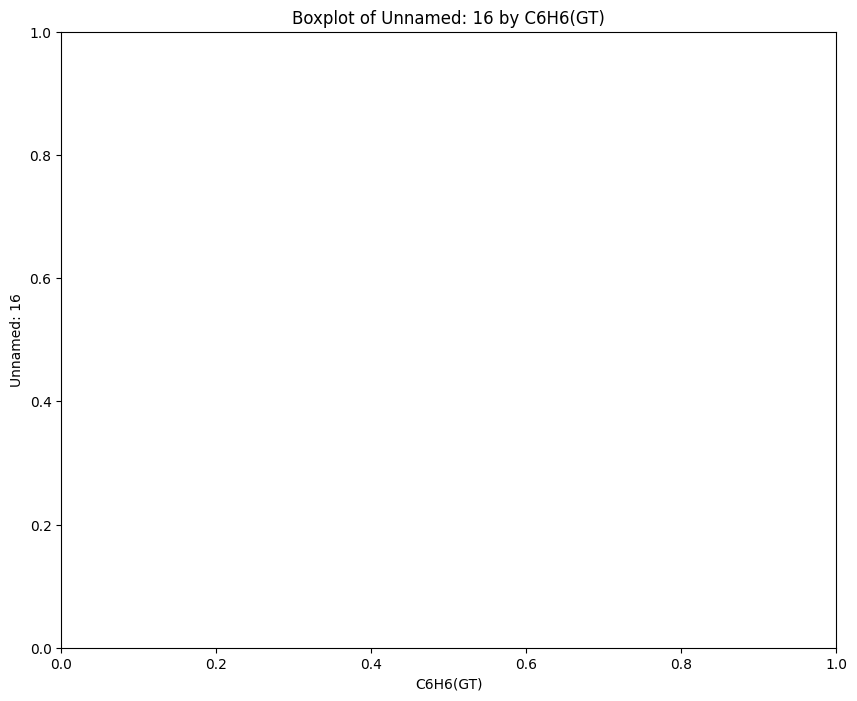

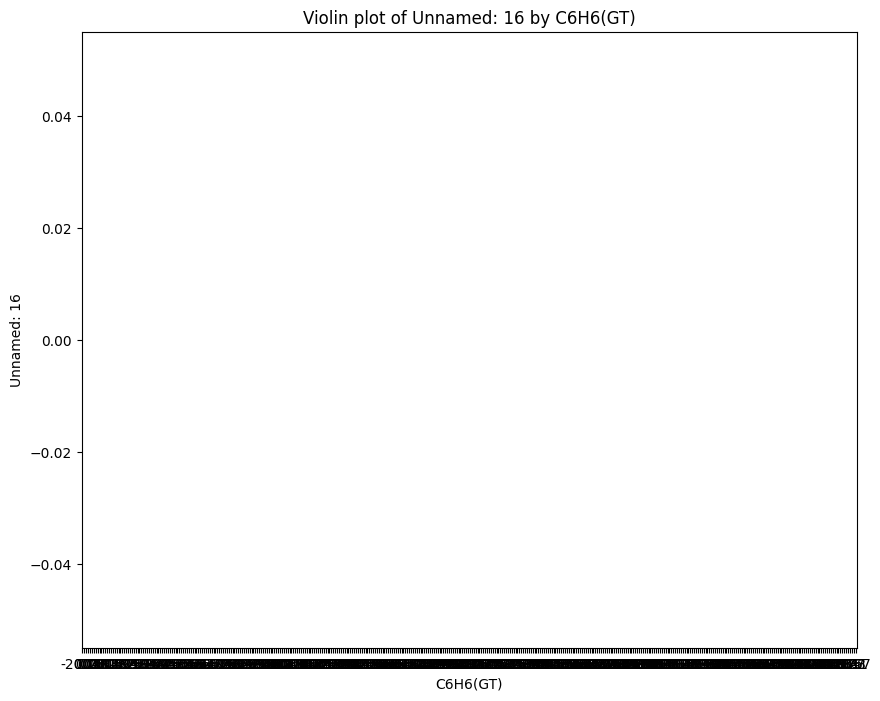

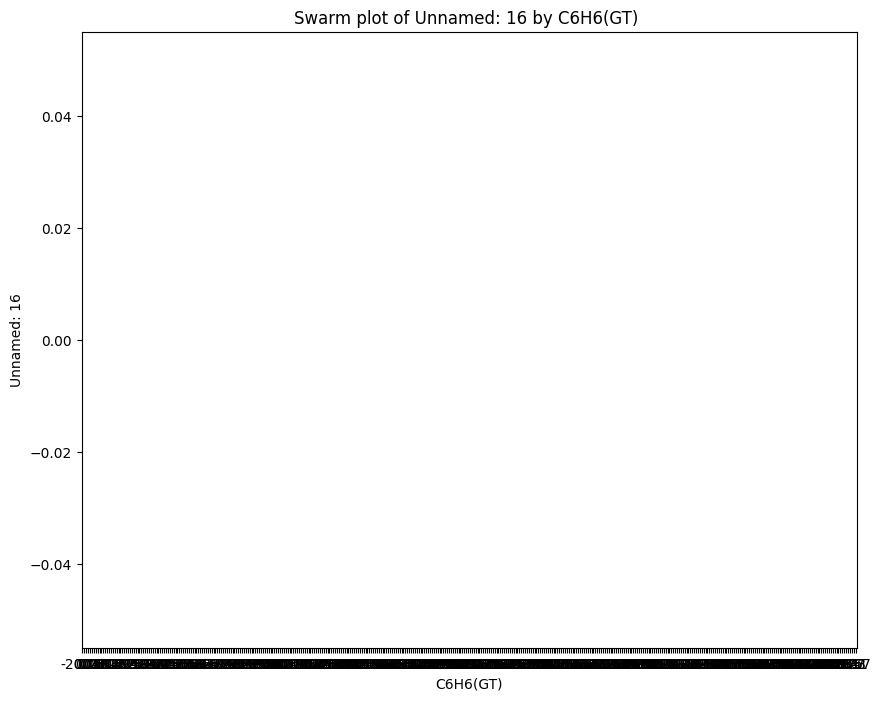

In [ ]:
for feature in x.columns:
  plt.figure(figsize=(10,8))
  sns.histplot(data=air_df,x=feature, kde=True)
  plt.title(f'Histogram of{feature}')
  plt.xlabel(feature)
  plt.ylabel('frequency')
  plt.show()

  plt.figure(figsize=(10, 8))
  sns.boxplot(data=air_df[air_df['C6H6(GT)'].notnull() & air_df[feature].notnull()], x='C6H6(GT)', y=feature)
  plt.title(f'Boxplot of {feature} by C6H6(GT)')
  plt.xlabel('C6H6(GT)')
  plt.ylabel(feature)
  plt.show()

  plt.figure(figsize=(10, 8))
  sns.violinplot(data=air_df, x='C6H6(GT)', y=feature)
  plt.title(f'Violin plot of {feature} by C6H6(GT)')
  plt.xlabel('C6H6(GT)')
  plt.ylabel(feature)
  plt.show()

  plt.figure(figsize=(10, 8))
  sns.swarmplot(data=air_df, x='C6H6(GT)', y=feature)
  plt.title(f'Swarm plot of {feature} by C6H6(GT) ')
  plt.xlabel('C6H6(GT)')
  plt.ylabel(feature)
  plt.show()


##BI VARIANT ##

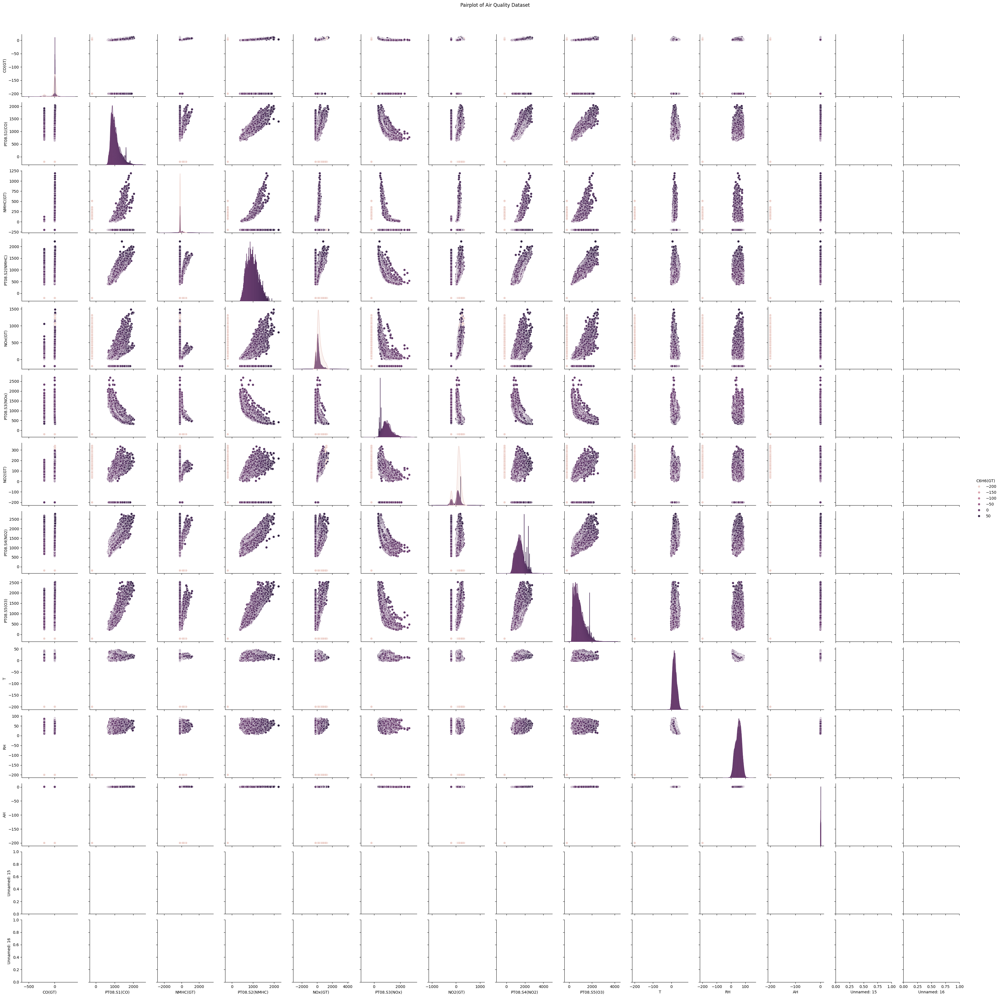

In [ ]:
sns.pairplot(air_df, hue='C6H6(GT)', diag_kind='kde')
plt.suptitle('Pairplot of Air Quality Dataset', y=1.02)
plt.show()


##MULTI VARIANT ANALYSIS##


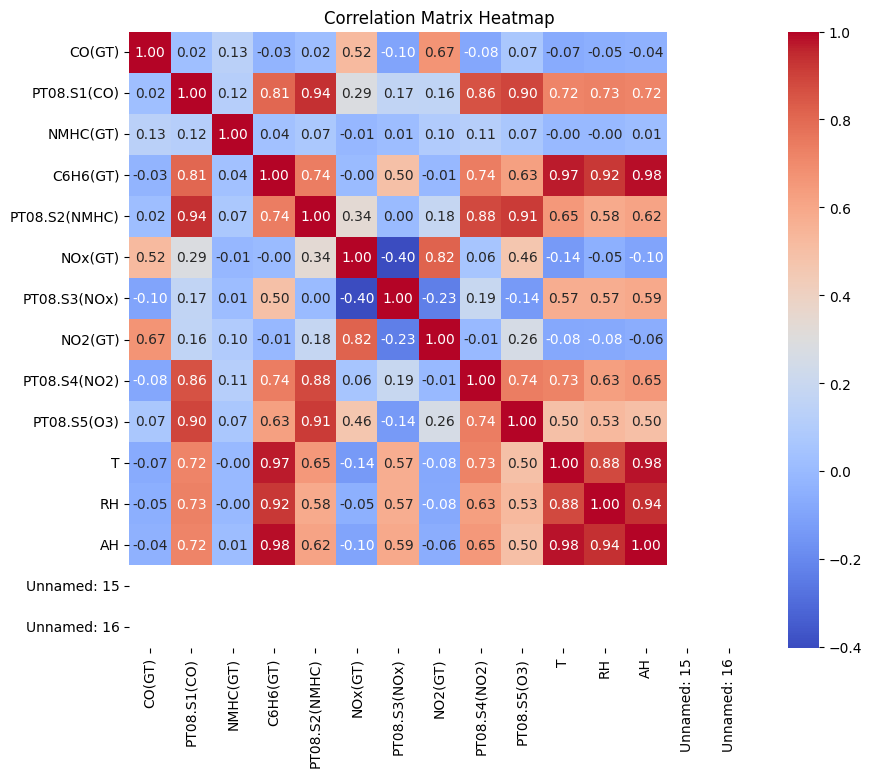

ValueError: could not convert string to float: '13-12-2004'

In [ ]:
# Analysis Matrices
'''def analysis_matrices(data):
    # Exclude non-numeric columns
    numeric_columns = data.select_dtypes(include=['int', 'float']).columns

    # Covariance matrix
    cov_matrix = data[numeric_columns].cov()
    print("\nCovariance Matrix:")
    print(cov_matrix)

    # Correlation matrix
    corr_matrix = data[numeric_columns].corr()
    print("\nCorrelation Matrix:")
    print(corr_matrix)

analysis_matrices(df)

air_df = air_df.fillna(0)
air_df = air_df.replace([np.inf, -np.inf], np.nan)
#air_df = air_df.clip(-1e20, 1e20)

correlation_matrix = air_df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap')
plt.show()

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

logistic_model = LogisticRegression(max_iter=100)
logistic_model.fit(X_train, y_train)

y_pred_logistic = logistic_model.predict(X_test)

plt.figure(figsize=(10, 6))
sns.heatmap(confusion_matrix(y_test, y_pred_logistic), annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted Air Class')
plt.ylabel('Actual Air Class')
plt.title('Confusion Matrix - Multiple Logistic Regression')
plt.show()

accuracy = accuracy_score(y_test, y_pred_logistic)
print("Accuracy of Logistic Regression:", accuracy)'''


# Handle missing values and infinite values
air_df = air_df.fillna(0)
air_df = air_df.replace([np.inf, -np.inf], np.nan)

# Select only numeric columns for correlation analysis
numeric_columns = air_df.select_dtypes(include=['int', 'float']).columns
numeric_df = air_df[numeric_columns]

# Calculate the correlation matrix
correlation_matrix = numeric_df.corr()

# Plot the correlation matrix heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap')
plt.show()

date_columns = air_df.select_dtypes(include=['object']).columns
for column in date_columns:
    air_df[column] = pd.to_datetime(air_df[column], errors='coerce')

# Extract features from date columns
for column in date_columns:
    air_df[column + '_year'] = air_df[column].dt.year
    air_df[column + '_month'] = air_df[column].dt.month
    air_df[column + '_day'] = air_df[column].dt.day

# Drop original date columns
air_df.drop(columns=date_columns, inplace=True)

# Drop non-numeric columns from the features
X = air_df.select_dtypes(include=['int', 'float'])

# Assuming 'x' contains features and 'y' contains the target variable
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# Train logistic regression model
logistic_model = LogisticRegression(max_iter=100)
logistic_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_logistic = logistic_model.predict(X_test)

# Plot the confusion matrix
plt.figure(figsize=(10, 6))
sns.heatmap(confusion_matrix(y_test, y_pred_logistic), annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted Air Class')
plt.ylabel('Actual Air Class')
plt.title('Confusion Matrix - Multiple Logistic Regression')
plt.show()

# Calculate and print the accuracy
accuracy = accuracy_score(y_test, y_pred_logistic)
print("Accuracy of Logistic Regression:", accuracy)



In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree


X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

dt_classifier = DecisionTreeClassifier(random_state=42)
dt_classifier.fit(X_train, y_train)


plt.figure(figsize=(15, 10))
plot_tree(dt_classifier, filled=True, feature_names=x.columns, class_names=['1', '2', '3'])
plt.title('Decision Tree Classifier')
plt.show()


y_pred = dt_classifier.predict(X_test)


accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy:", accuracy)
print("Confusion Matrix:")
print(conf_matrix)


ValueError: could not convert string to float: '19-01-2005'

In [ ]:
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
pca = PCA(n_components=2)
principal_components = pca.fit_transform(x_scaled)

pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

pca_df = pd.concat([pca_df, y], axis=1)


plt.figure(figsize=(10, 6))
targets = pca_df['C6H6(GT)'].unique()
colors = ['r', 'g', 'b']
for target, color in zip(targets, colors):
    indices_to_keep = pca_df['C6H6(GT)'] == target
    plt.scatter(pca_df.loc[indices_to_keep, 'PC1'], pca_df.loc[indices_to_keep, 'PC2'], c=color, s=50)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(targets)
plt.title('PCA of Wine Dataset')
plt.grid()
plt.show()

ValueError: could not convert string to float: '10-03-2004'

##Second Attempt##


Univariate Analysis

Summary Statistics:
            CO(GT)  PT08.S1(CO)     NMHC(GT)     C6H6(GT)  PT08.S2(NMHC)  \
count  9357.000000  9357.000000  9357.000000  9357.000000    9357.000000   
mean    -34.207524  1048.990061  -159.090093     1.865683     894.595276   
std      77.657170   329.832710   139.789093    41.380206     342.333252   
min    -200.000000  -200.000000  -200.000000  -200.000000    -200.000000   
25%       0.600000   921.000000  -200.000000     4.000000     711.000000   
50%       1.500000  1053.000000  -200.000000     7.900000     895.000000   
75%       2.600000  1221.000000  -200.000000    13.600000    1105.000000   
max      11.900000  2040.000000  1189.000000    63.700000    2214.000000   

           NOx(GT)  PT08.S3(NOx)      NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)  \
count  9357.000000   9357.000000  9357.000000   9357.000000  9357.000000   
mean    168.616971    794.990168    58.148873   1391.479641   975.072032   
std     257.433866    321.993552   126.940455 

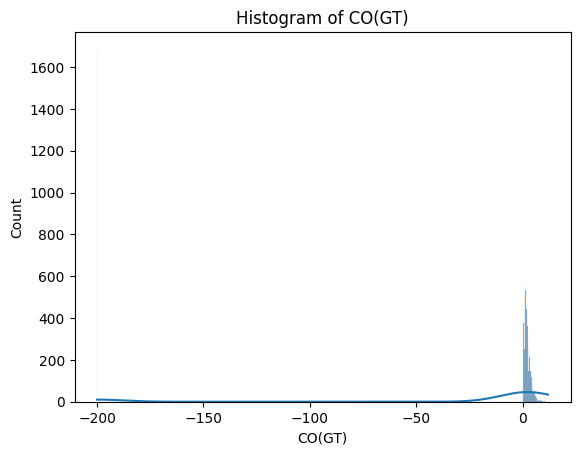

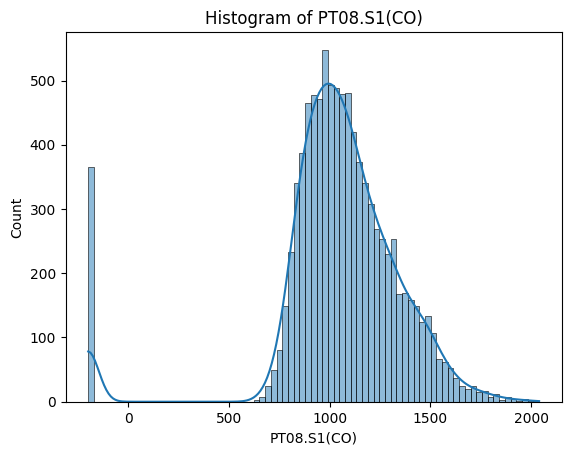

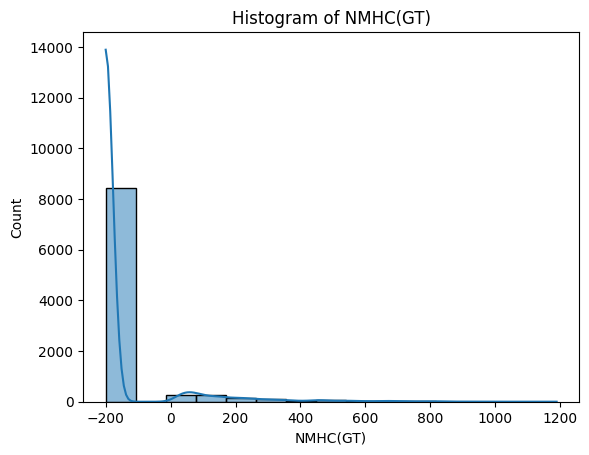

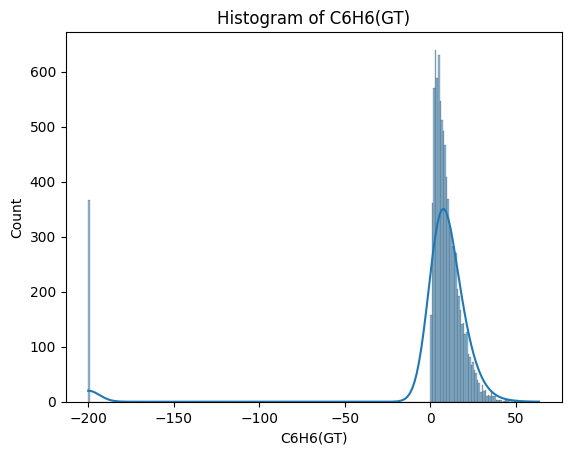

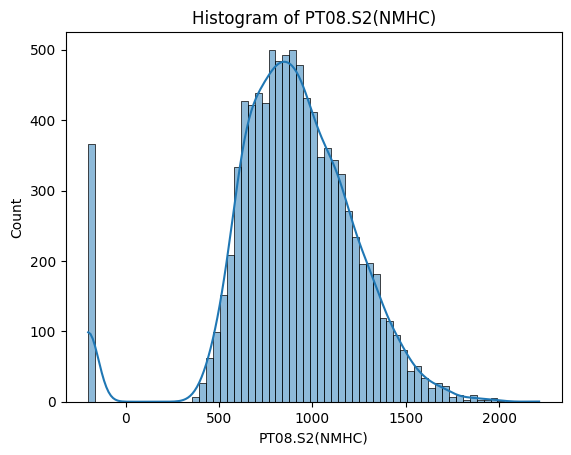

...

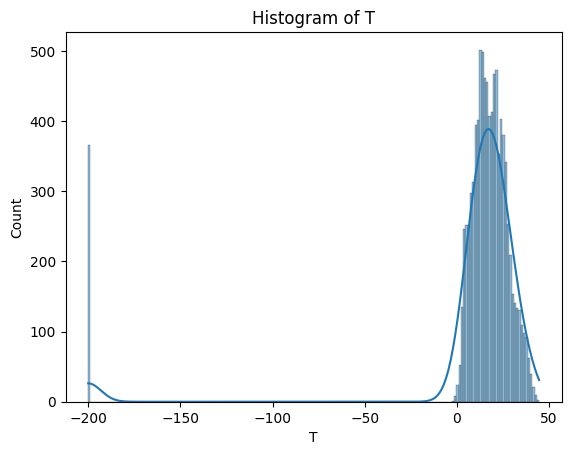

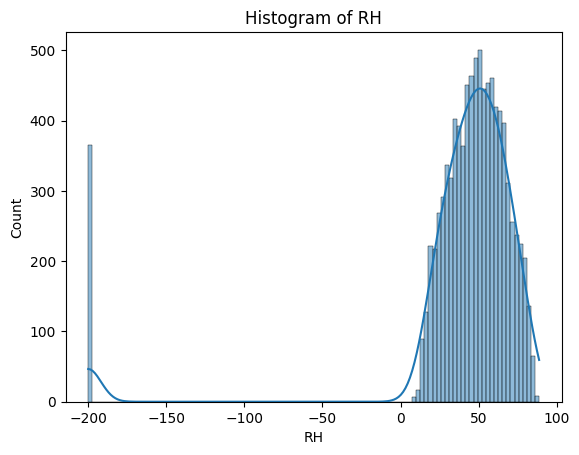

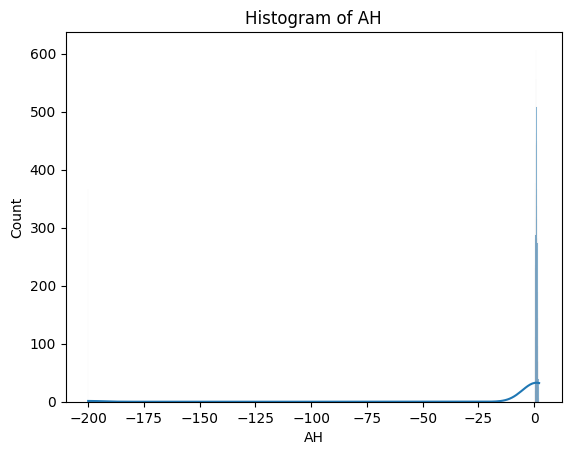

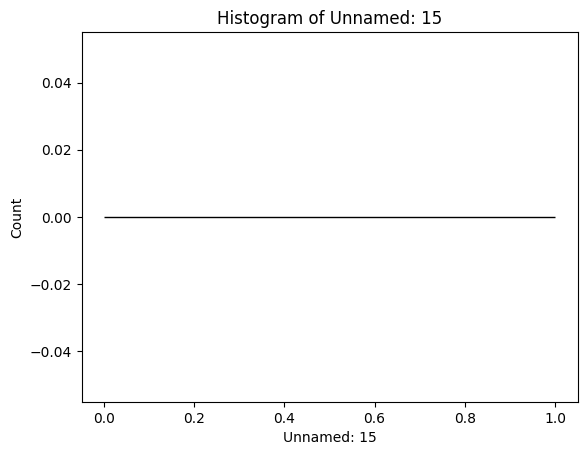

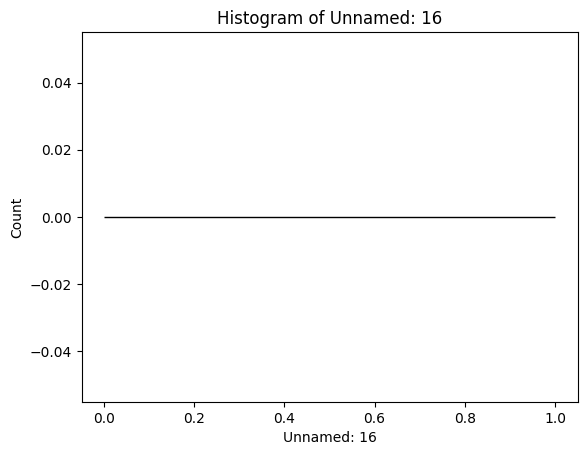


Countplots:


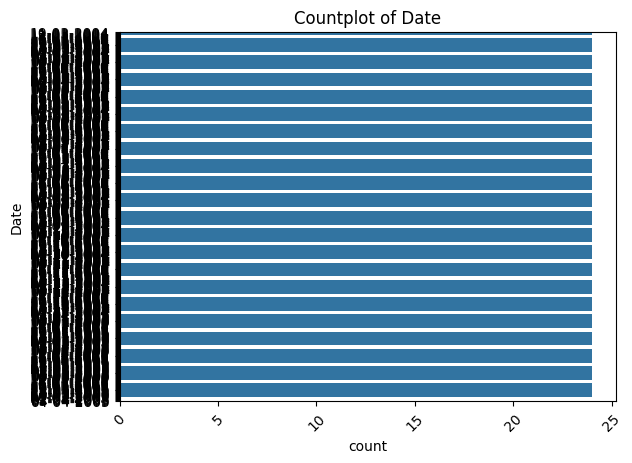

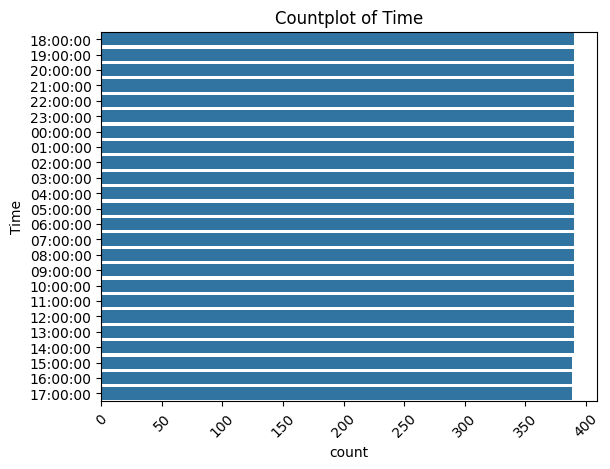

Bi Variate Analysis



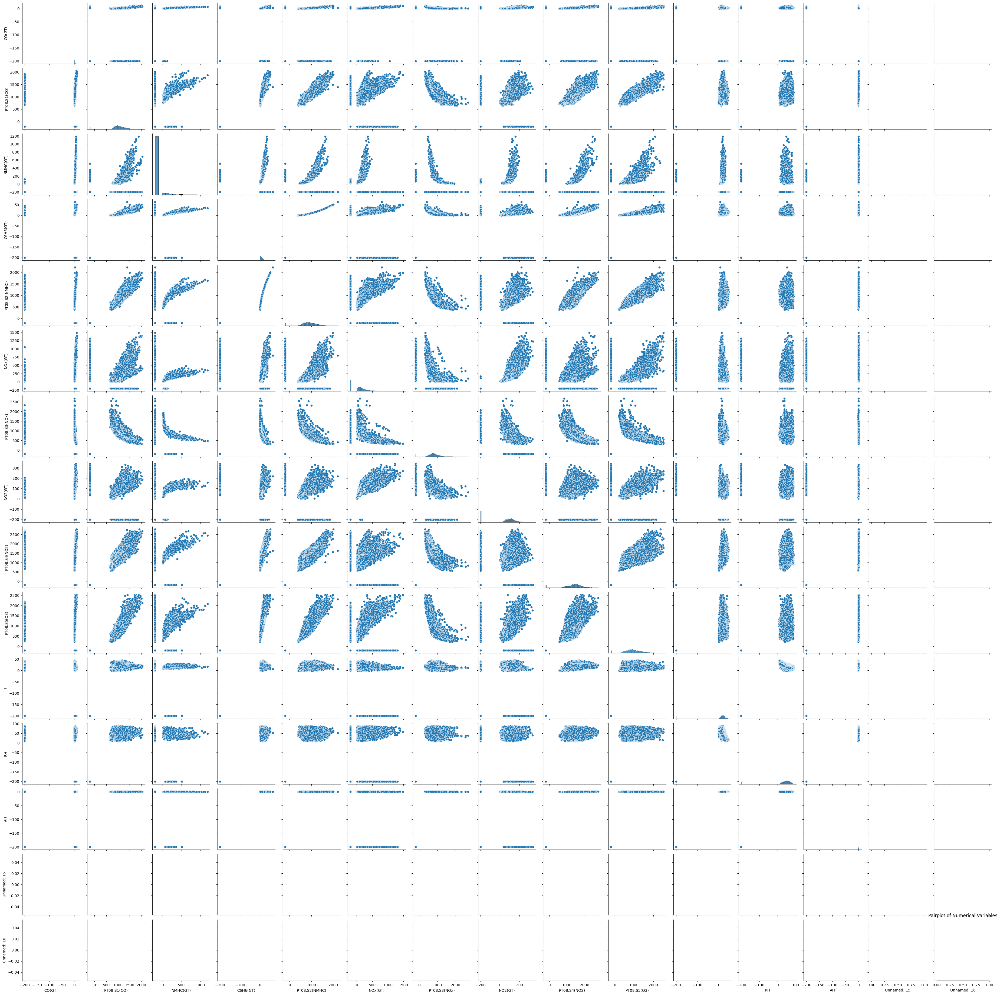

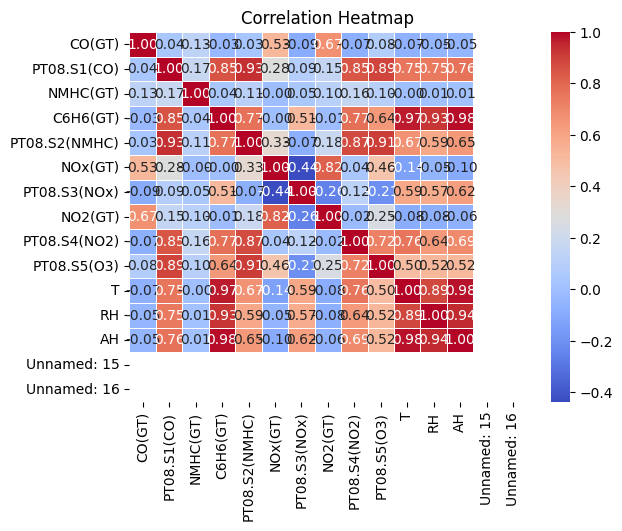

Multivariate Analysis


Boxplots of Numerical Variables by Category:


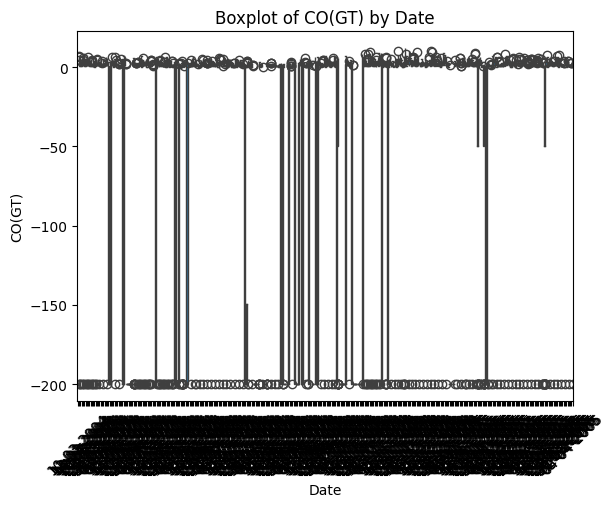

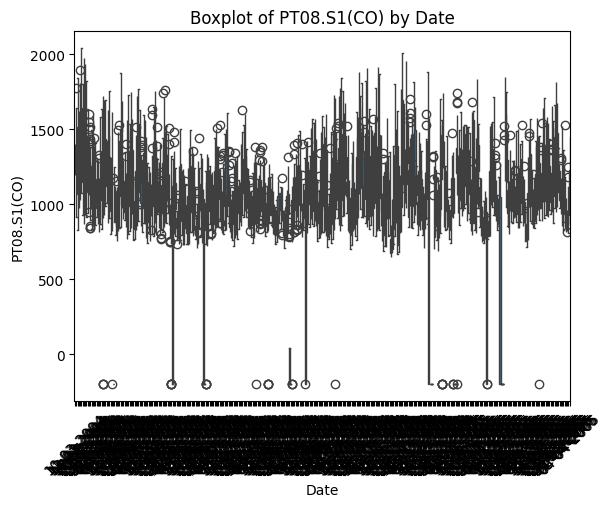

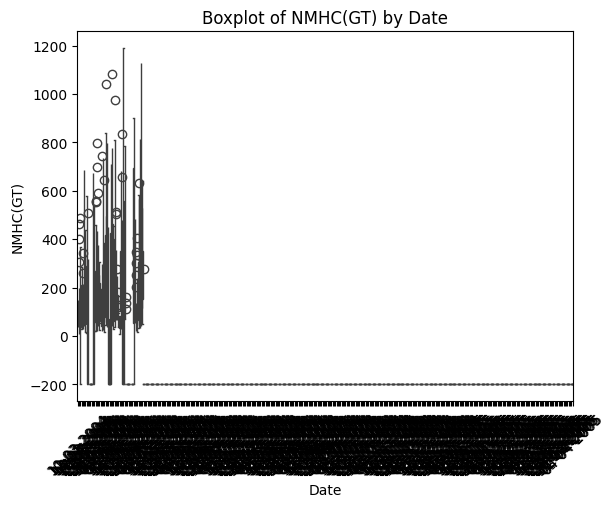

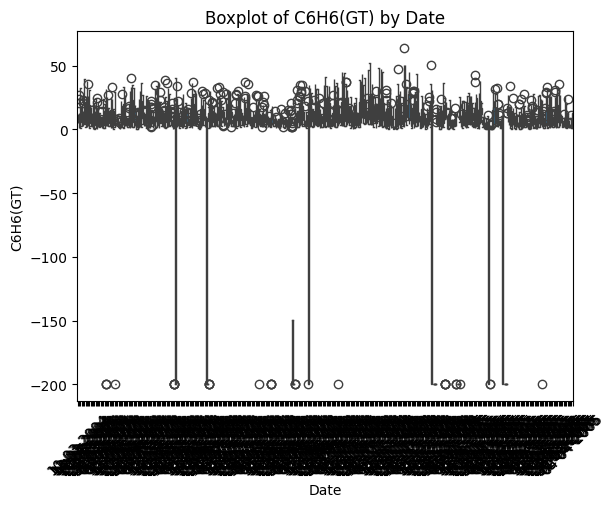

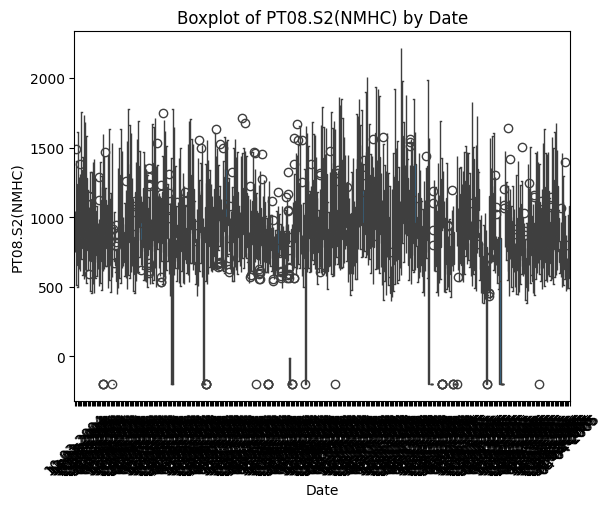

...

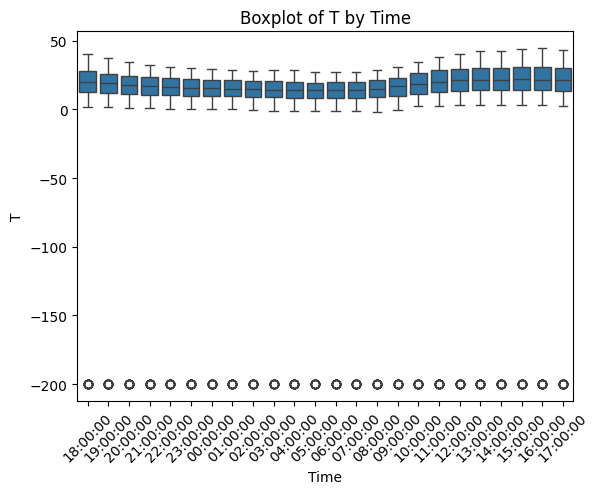

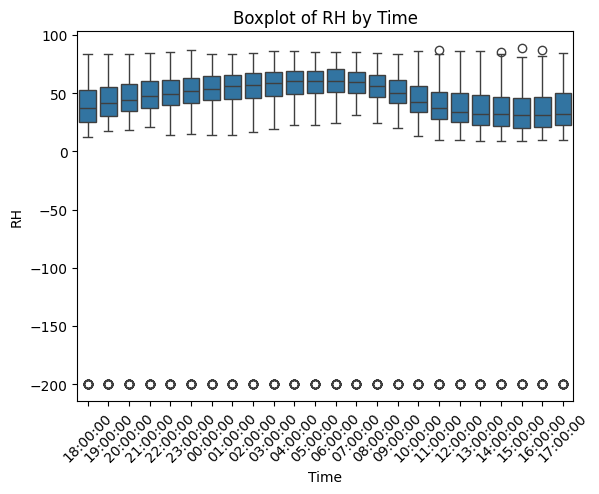

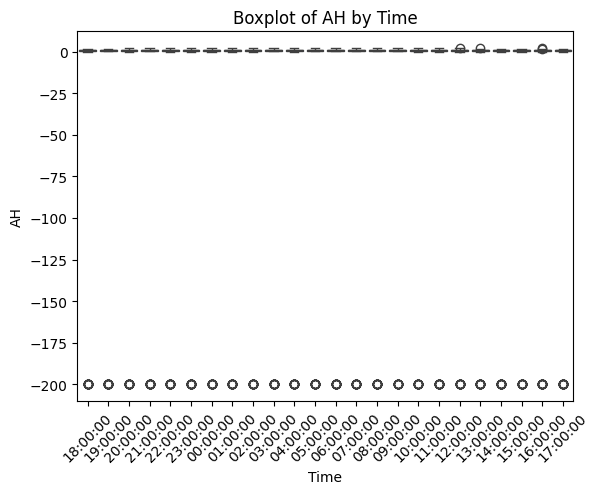

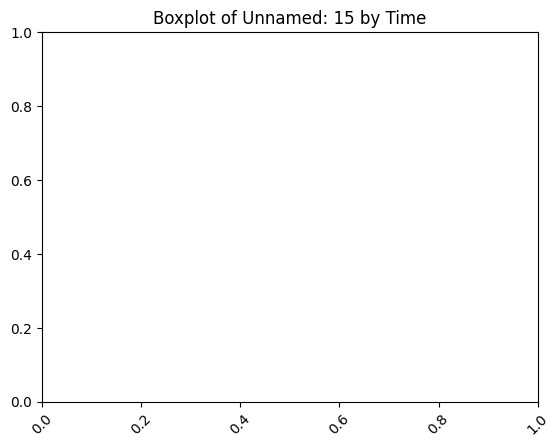

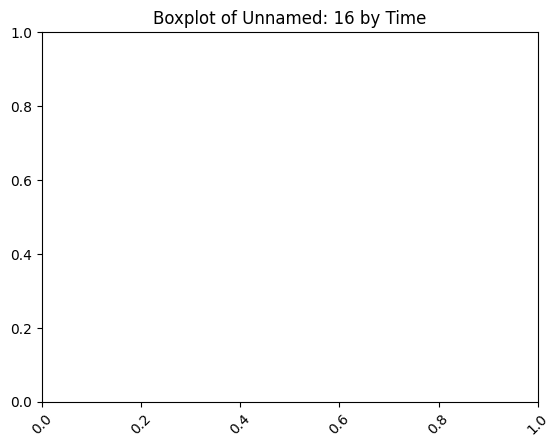

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the CSV file into a pandas DataFrame
#df = pd.read_csv('your_file.csv')
df = pd.read_csv("/content/AirQuality/AirQualityUCI.csv")

print("Univariate Analysis\n")

# Univariate Analysis
def univariate_analysis(data):
    # Summary statistics
    print("Summary Statistics:")
    print(data.describe())

    # Histogram for each numerical variable
    print("\nHistograms:")
    for column in data.select_dtypes(include=['int', 'float']):
        plt.figure()
        sns.histplot(data[column], kde=True)
        plt.title(f'Histogram of {column}')
        plt.show()

    # Count plot for each categorical variable
    print("\nCountplots:")
    for column in data.select_dtypes(include=['object']):
        plt.figure()
        sns.countplot(data[column])
        plt.title(f'Countplot of {column}')
        plt.xticks(rotation=45)
        plt.show()

univariate_analysis(df)

# Bivariate Analysis
# Bivariate Analysis
print("Bi Variate Analysis\n")

def bivariate_analysis(data):
    # Pairplot for numerical variables
    numerical_columns = data.select_dtypes(include=['int', 'float']).columns
    sns.pairplot(data=data[numerical_columns], kind='scatter')
    plt.title('Pairplot of Numerical Variables')
    plt.show()

    # Heatmap for correlation matrix of numerical variables
    corr = data[numerical_columns].corr()
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
    plt.title('Correlation Heatmap')
    plt.show()

bivariate_analysis(df)

print("Multivariate Analysis\n")

# Multivariate Analysis
def multivariate_analysis(data):
    # Boxplot of numerical variables against categorical variables
    print("\nBoxplots of Numerical Variables by Category:")
    for column in data.select_dtypes(include=['object']):
        for num_column in data.select_dtypes(include=['int', 'float']):
            plt.figure()
            sns.boxplot(x=column, y=num_column, data=data[data[column].notnull() & data[num_column].notnull()])
            plt.title(f'Boxplot of {num_column} by {column}')
            plt.xticks(rotation=45)
            plt.show()

multivariate_analysis(df)




In [ ]:
# Analysis Matrices
def analysis_matrices(data):
    # Exclude non-numeric columns
    numeric_columns = data.select_dtypes(include=['int', 'float']).columns

    # Covariance matrix
    cov_matrix = data[numeric_columns].cov()
    print("\nCovariance Matrix:")
    print(cov_matrix)

    # Correlation matrix
    corr_matrix = data[numeric_columns].corr()
    print("\nCorrelation Matrix:")
    print(corr_matrix)

analysis_matrices(df)



Covariance Matrix:
                     CO(GT)    PT08.S1(CO)      NMHC(GT)      C6H6(GT)  \
CO(GT)          6030.636106    1060.706627   1393.332189   -100.833139   
PT08.S1(CO)     1060.706627  108789.616511   7838.528818  11637.942562   
NMHC(GT)        1393.332189    7838.528818  19540.990493    215.892162   
C6H6(GT)        -100.833139   11637.942562    215.892162   1712.321485   
PT08.S2(NMHC)    795.566920  105359.040547   5268.944294  10871.319094   
NOx(GT)        10524.588738   23604.377873   -159.321066    -12.505974   
PT08.S3(NOx)   -2249.980814    9241.812429   2197.486074   6824.537328   
NO2(GT)         6615.860900    6449.079825   1833.180259    -57.741567   
PT08.S4(NO2)   -2674.868836  130238.405473  10624.770130  14976.956126   
PT08.S5(O3)     2849.749762  134501.613264   6463.193964  12126.475644   
T               -231.294906   10756.504295     -0.054402   1736.599810   
RH              -191.814758   12591.448829     59.310878   1960.516728   
AH              -1